In [1]:
import pickle
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os 
from moviepy.editor import VideoFileClip
from IPython.display import HTML
import utils

In [2]:
cal_path = "camera_cal"
objpoints = []
imgpoints = []
pattern_shape = (9, 6)
obj_point = np.zeros(((pattern_shape[0]*pattern_shape[1]), 3), np.float32)
obj_point[:, :2] = np.mgrid[0 : pattern_shape[0], 0 : pattern_shape[1]].T.reshape(-1, 2)
for i in os.listdir(cal_path):
    img_path = os.path.join(cal_path, i)
    img = cv2.imread(img_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    ret, corners = cv2.findChessboardCorners(gray, pattern_shape, None)
    if ret:
        objpoints.append(obj_point)
        imgpoints.append(corners)

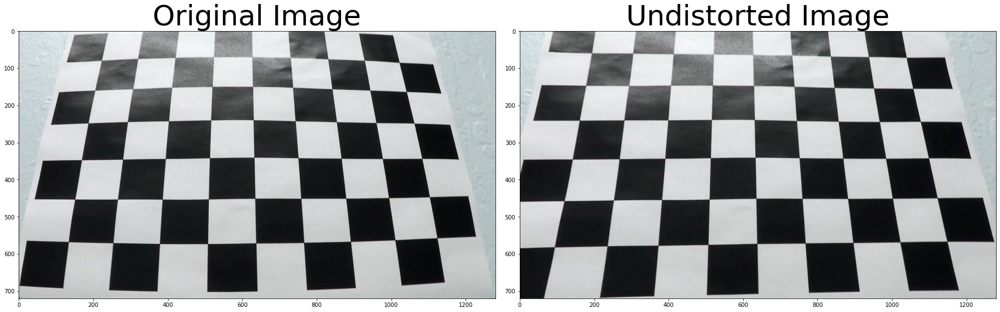

In [3]:
img = cv2.imread('camera_cal/calibration3.jpg')
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img.shape[1::-1], None, None)
chess = utils.cal_undistort(img, mtx, dist )
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(chess)
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

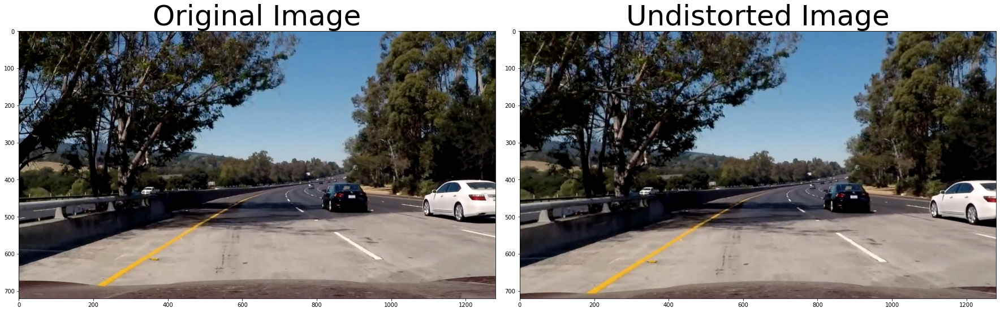

In [4]:
img = cv2.imread('test_images/test5.jpg')
chess = utils.cal_undistort(img, mtx, dist )
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(cv2.cvtColor(chess, cv2.COLOR_BGR2RGB))
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

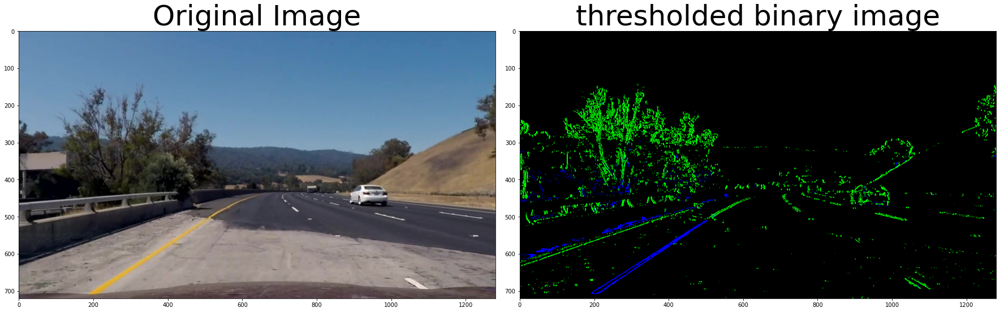

In [5]:
# image = mpimg.imread('test_images/straight_lines2.jpg') 
image = mpimg.imread('test_images/test20.jpg') 
image = utils.cal_undistort(image, mtx, dist)
threshold_img = utils.pipeline(image, color=True)
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(threshold_img)
ax2.set_title('thresholded binary image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

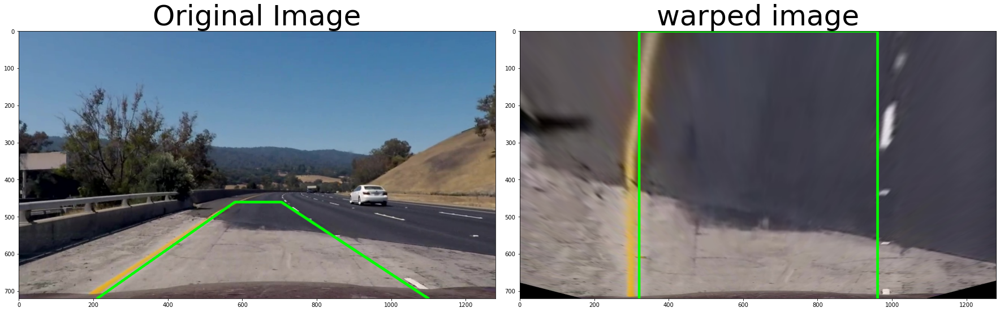

In [6]:
vertices = np.array([[[210, image.shape[0]], [580, 460], [705, 460], [1100, image.shape[0]]]])
image_copy = image.copy()
utils.draw_line(image_copy, vertices[0])
x1 = int(image.shape[1]/4)
x3 = int(image.shape[1]/4)*3
src = vertices[0].astype(np.float32)
dst = np.float32([[x1, image.shape[0]], [x1, 0], [x3, 0], [x3, image.shape[0]]])
M = cv2.getPerspectiveTransform(src, dst)
warped = cv2.warpPerspective(image, M, image.shape[1::-1], flags=cv2.INTER_LINEAR)
warped_copy = warped.copy()
utils.draw_line(warped_copy, [[x1, image.shape[0]], [x1, 0], [x3, 0], [x3, image.shape[0]]])



f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image_copy)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(warped_copy)
ax2.set_title('warped image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

Text(0.5, 1.0, 's Image')

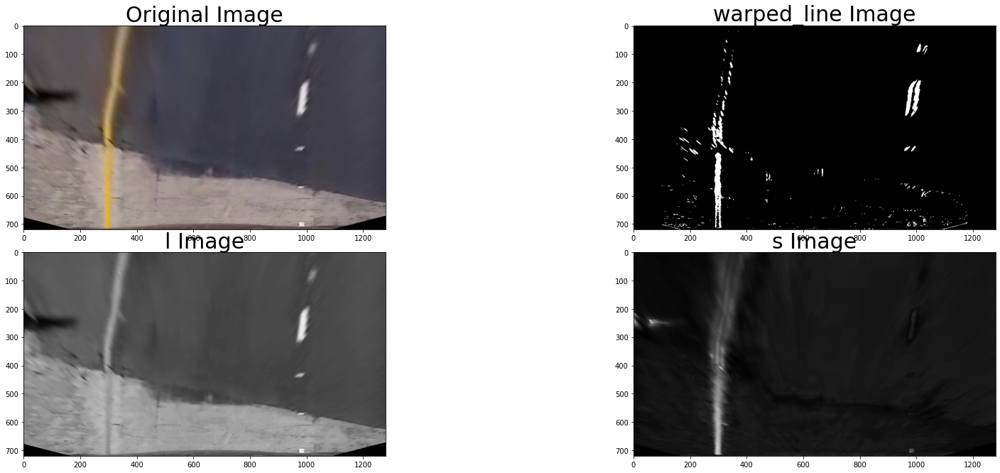

In [7]:
warped_line = utils.pipeline(warped, color=False)

warped_line[:, 0:100] = 0
warped_line[:, warped_line.shape[1]-100:warped_line.shape[1]] = 0
hls = cv2.cvtColor(warped, cv2.COLOR_RGB2HLS)
l_channel = hls[:,:,1]
s_channel = hls[:,:,2]
f, (ax) = plt.subplots(2, 2, figsize=(24, 9))
f.tight_layout()
ax[0, 0].imshow(warped, cmap="gray")
ax[0, 0].set_title('Original Image', fontsize=30)
ax[0, 1].imshow(warped_line, cmap="gray")
ax[0, 1].set_title('warped_line Image', fontsize=30)

ax[1, 0].imshow(l_channel, cmap="gray")
ax[1, 0].set_title('l Image', fontsize=30)
ax[1, 1].imshow(s_channel, cmap="gray")
ax[1, 1].set_title('s Image', fontsize=30)
# plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

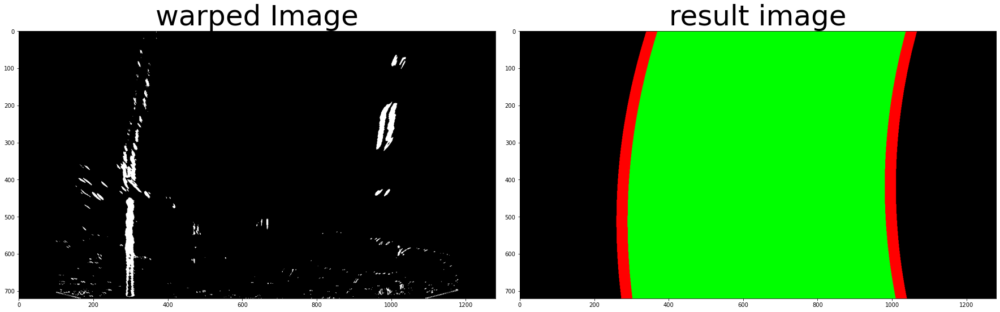

In [8]:
out_img0, left_fit, right_fit, curve, center_off = utils.find_lane_pixels(warped_line)
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(warped_line, cmap="gray")
ax1.set_title('warped Image', fontsize=50)
ax2.imshow(out_img0)
ax2.set_title('result image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

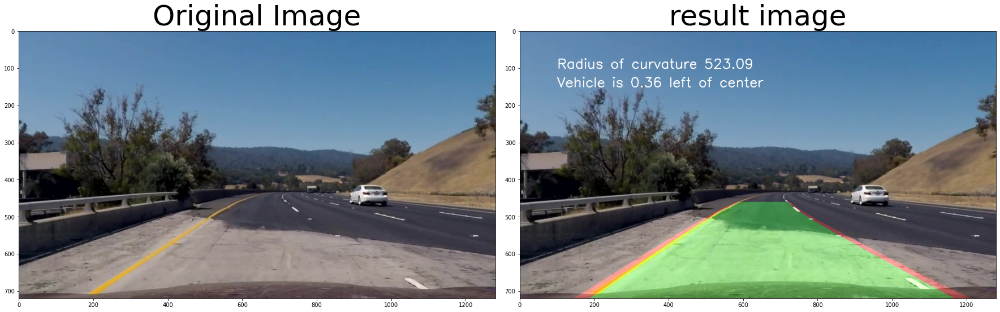

In [9]:

text0 = "Radius of curvature {curve:5.2f}".format(curve=curve)
text1 = "Vehicle is {off:.2f} {direc} of center".format(off=np.absolute(center_off), direc = "right" if center_off>0 else "left")

M = cv2.getPerspectiveTransform(dst, src)
warped = cv2.warpPerspective(out_img0, M, out_img0.shape[1::-1], flags=cv2.INTER_LINEAR)
result = cv2.addWeighted(image, 1, warped.astype(np.uint8), 0.3, 0)
cv2.putText(result, text0, (100, 100), cv2.FONT_HERSHEY_SIMPLEX, 1.2, (255,255,255), 2)
cv2.putText(result, text1, (100, 150), cv2.FONT_HERSHEY_SIMPLEX, 1.2, (255,255,255), 2)
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(result)
ax2.set_title('result image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [10]:
def process_image(image): 
    image = utils.cal_undistort(image, mtx, dist)
    vertices = np.array([[[210, image.shape[0]], [580, 460], [705, 460], [1100, image.shape[0]]]])
    src = vertices[0].astype(np.float32)
    dst = np.float32([[x1, image.shape[0]], [x1, 0], [x3, 0], [x3, image.shape[0]]])
    M = cv2.getPerspectiveTransform(src, dst)
    warped = cv2.warpPerspective(image, M, image.shape[1::-1], flags=cv2.INTER_LINEAR)
    
    warped_pipe = utils.pipeline(warped, color=False)
    warped_pipe[:, 0:100] = 0
    warped_pipe[:, warped_pipe.shape[1]-100:warped_pipe.shape[1]] = 0
    out_img0, left_fitx, right_fitx, curve, center_off = utils.find_lane_pixels(warped_pipe)
    text0 = "Radius of curvature {curve:5.2f}".format(curve=curve)
    text1 = "Vehicle is {off:.2f}m {direc} of center".format(off=np.absolute(center_off), direc = "right" if center_off>0 else "left")
    M = cv2.getPerspectiveTransform(dst, src)
    warped = cv2.warpPerspective(out_img0, M, out_img0.shape[1::-1], flags=cv2.INTER_LINEAR)
    result = cv2.addWeighted(image, 1, warped.astype(np.uint8), 0.3, 0)
    cv2.putText(result, text0, (100, 100), cv2.FONT_HERSHEY_SIMPLEX, 1.2, (255,255,255), 2)
    cv2.putText(result, text1, (100, 150), cv2.FONT_HERSHEY_SIMPLEX, 1.2, (255,255,255), 2)
    return result

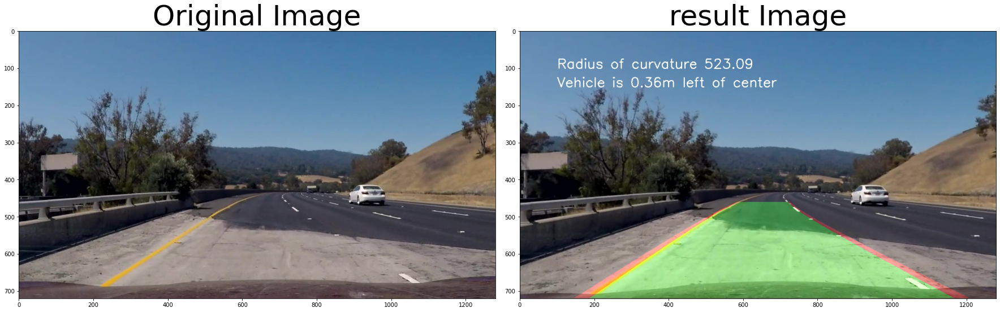

In [11]:
image = mpimg.imread('test_images/test20.jpg') 
result = process_image(image)
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(result)
ax2.set_title('result Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [12]:
video_output = 'test_videos_output/project_video16.mp4'
clip1 = VideoFileClip("project_video.mp4")
# clip1 = VideoFileClip('project_video.mp4').subclip(0,5)
white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time white_clip.write_videofile(video_output, audio=False)

Moviepy - Building video test_videos_output/project_video16.mp4.
Moviepy - Writing video test_videos_output/project_video16.mp4



Moviepy - Done !
Moviepy - video ready test_videos_output/project_video16.mp4
Wall time: 1min 53s
